In [1]:
import numpy as np
import pandas
import scanpy
import scanpy as sc
import anndata
import os
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import pandas as pd
import scanpy as sc
import scvelo as scv

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

BATCH_LABELS = ("control", "TGFB1", "BMP9", "BMP9-TGFB1")

/usr/local/lib/python3.6/dist-packages/numba/errors.py:131: UserWarning: Insufficiently recent colorama version found. Numba requires colorama >= 0.3.9
  warnings.warn(msg)
/usr/local/lib/python3.6/dist-packages/scanpy/api/__init__.py:6: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning


scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.3.1 pandas==0.25.1 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


## Load previous notebook's results

In [2]:
batches = {}

for batch in BATCH_LABELS:
    filename = "tgfb1-4-" + batch + ".h5ad"
    filename = os.path.join("write", filename)
    batches[batch] = anndata.read(filename)

batches

{'control': AnnData object with n_obs × n_vars = 1463 × 4590 
     obs: 'batch', 'cellular_barcode', 'n_counts', 'percent_mito', 'S_score', 'G2M_score', 'phase', 'louvain', 'Alk5 signature', 'Alk1 signature', 'Fibroblast signature', 'SMC signature', 'Osteo signature', 'Ca2+ signature', 'Apoptosis signature'
     var: 'gene_names', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'genes_before_highly_variable', 'genes_original', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'phase_colors'
     obsm: 'X_pca', 'X_umap'
     varm: 'PCs'
     layers: 'ambiguous', 'spliced', 'unspliced',
 'TGFB1': AnnData object with n_obs × n_vars = 1816 × 4606 
     obs: 'batch', 'cellular_barcode', 'n_counts', 'percent_mito', 'S_score', 'G2M_score', 'phase', 'louvain', 'Alk5 signature', 'Alk1 signature', 'Fibroblast signature', 'SMC signature', 'Osteo signature', 'Ca2+ signature', 'Apoptosis signature'
     var: 'gene_names', 'highly_variable', 'means', 'dispersions', 'dispersion

## Compute velocity vector fields

In [3]:
for matrix in batches.values():
    scv.tl.velocity(matrix, mode='stochastic')
    scv.tl.velocity_graph(matrix)

Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:02) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)
computing velocities

In [4]:
for matrix in batches.values():
    scv.tl.velocity_embedding(matrix, basis='umap')

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


## Create RNA velocity graphs colored by different variables

In [5]:
COLOR_VELOCITY_BY = ("louvain", "SERPINE1", "PLAUR")

now plotting for batch control


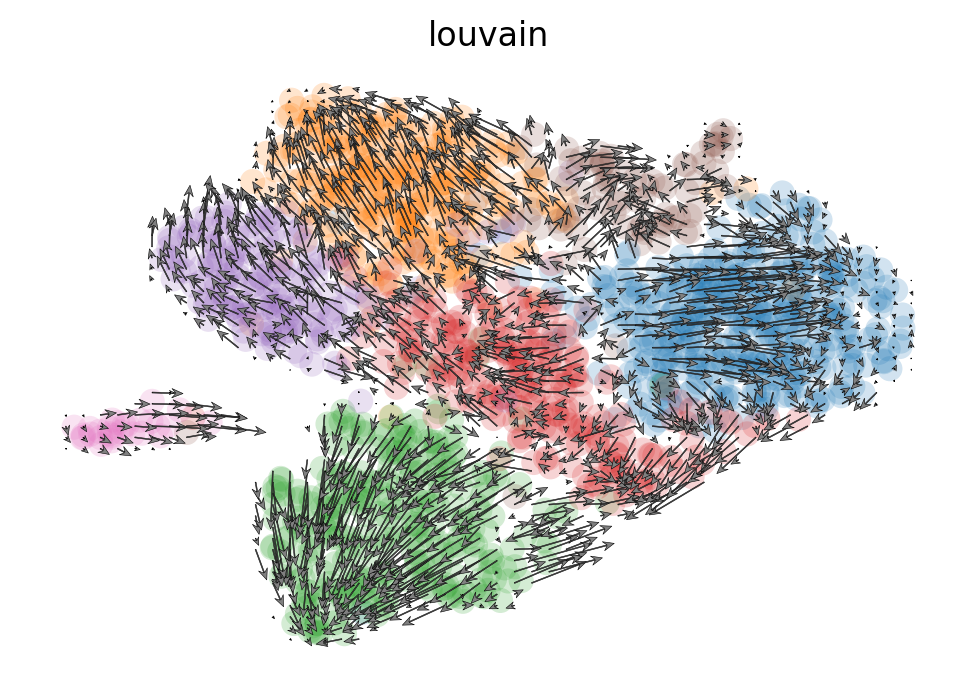

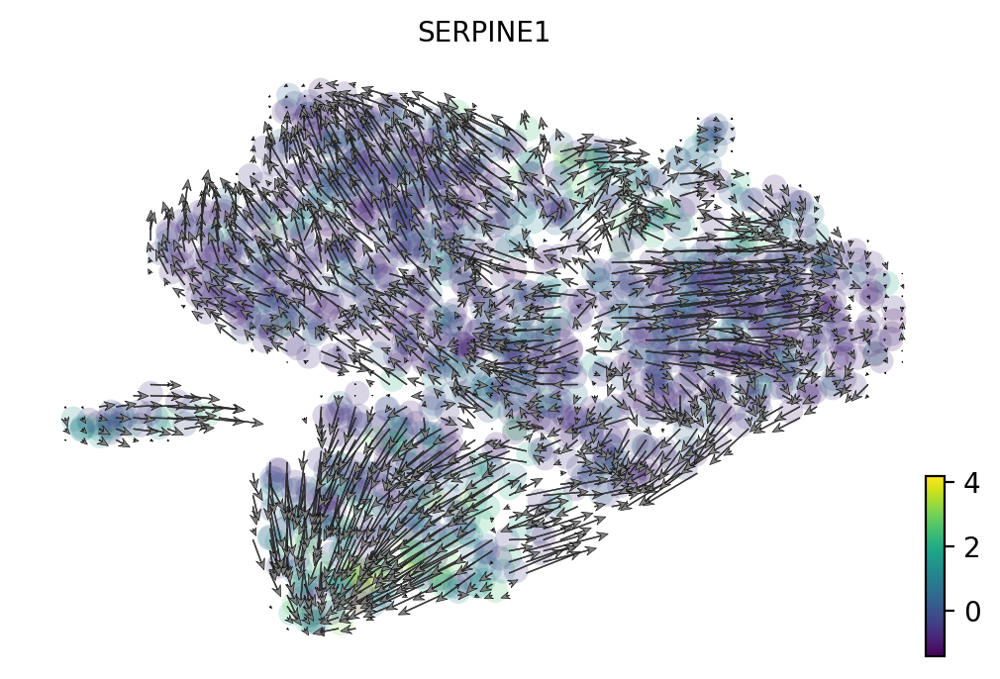

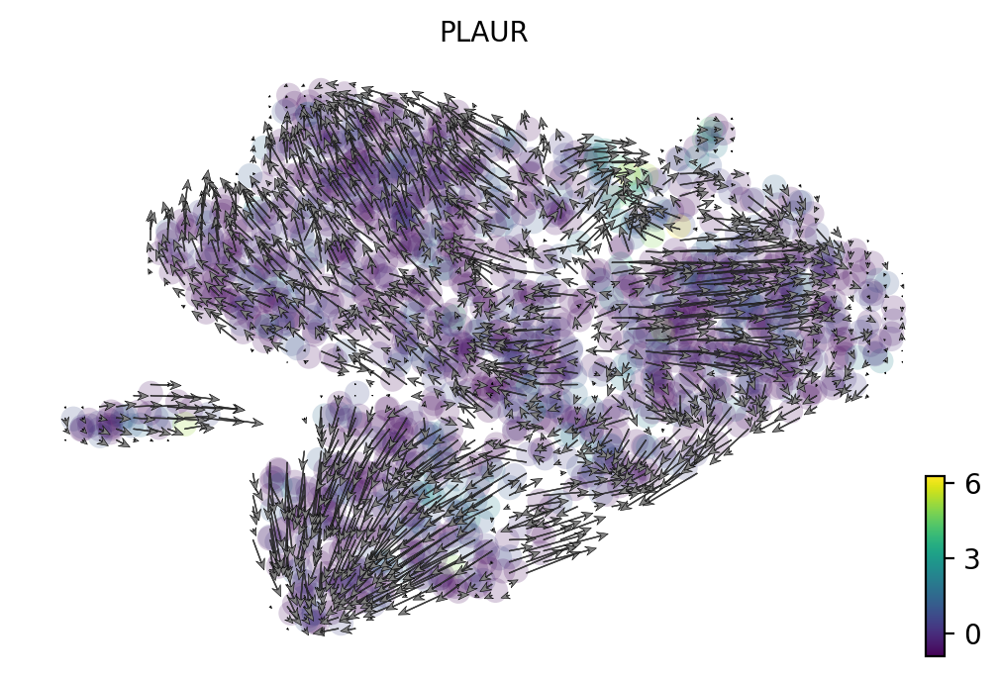

now plotting for batch TGFB1


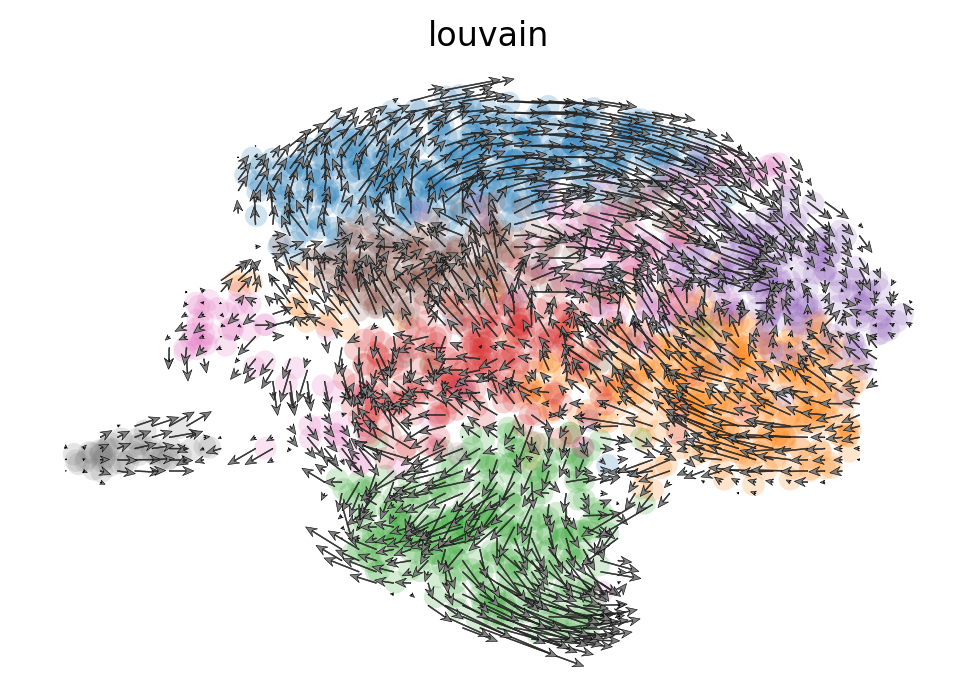

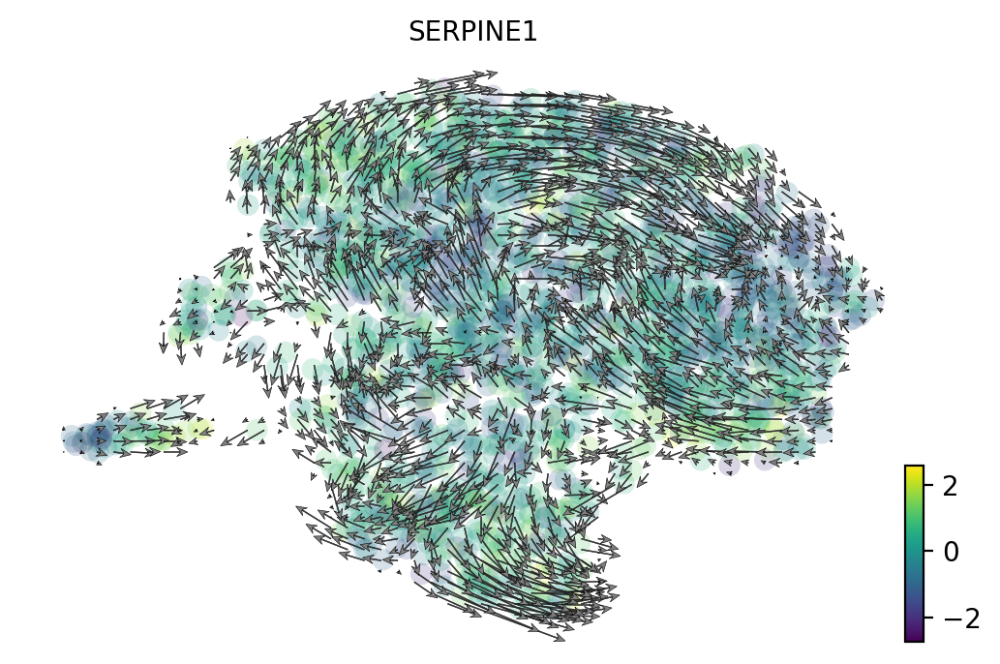

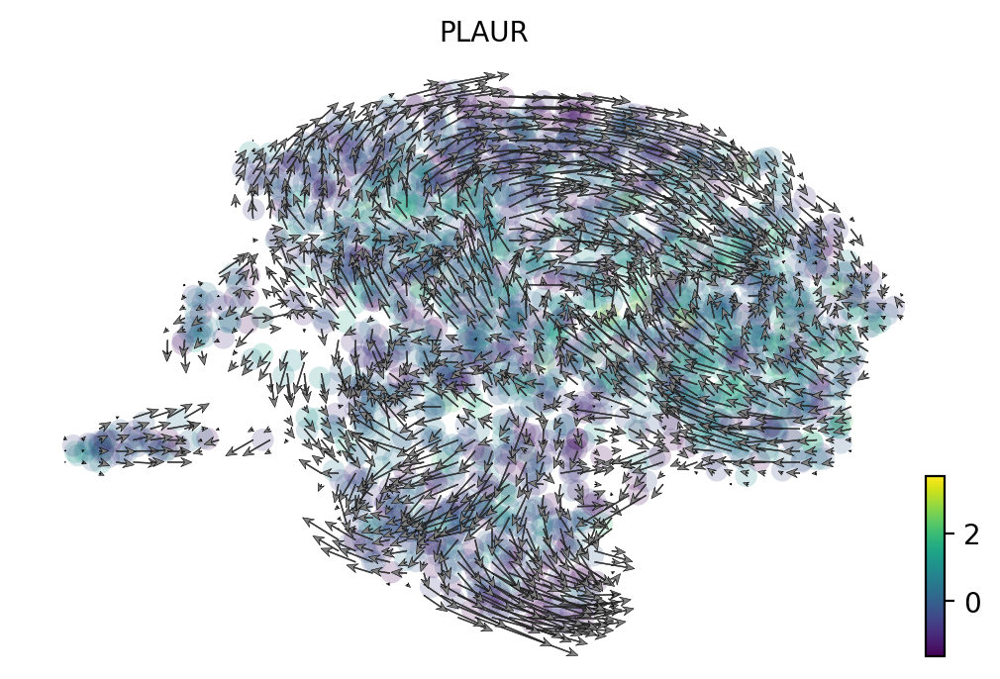

now plotting for batch BMP9


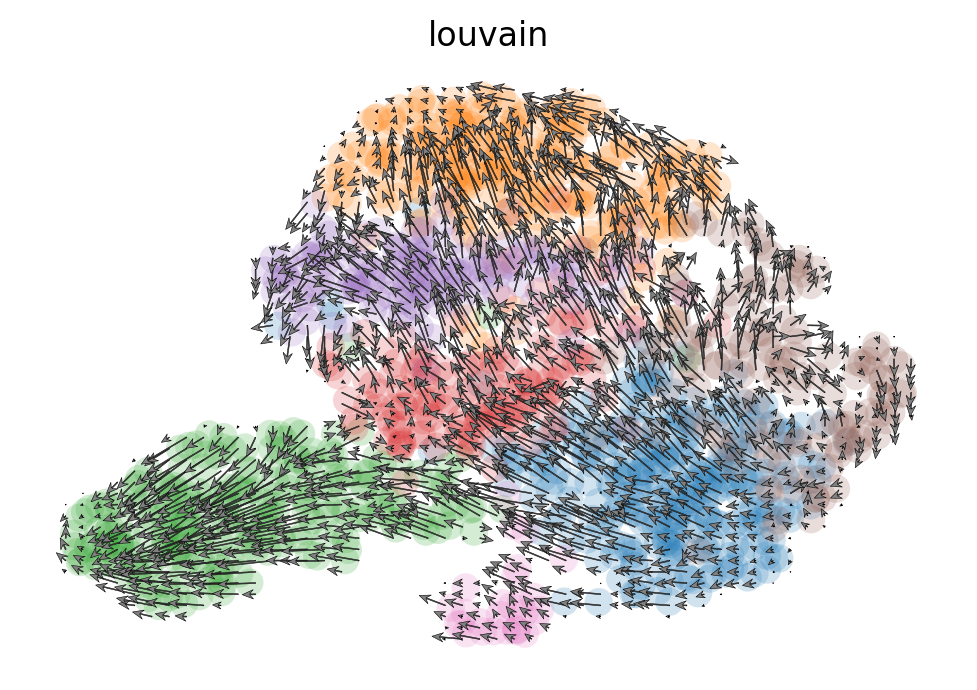

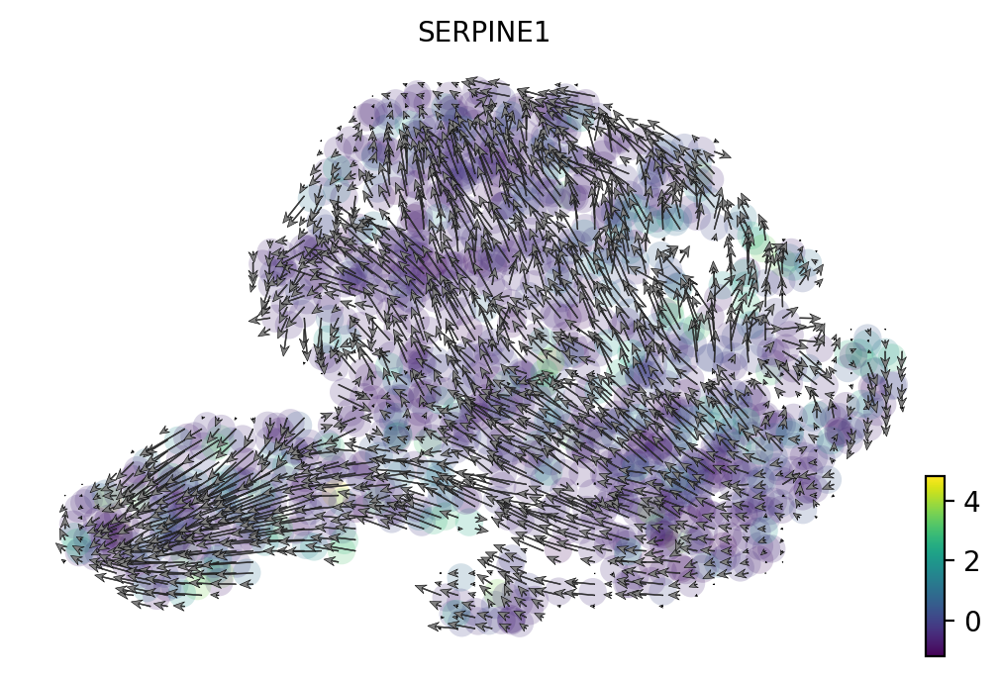

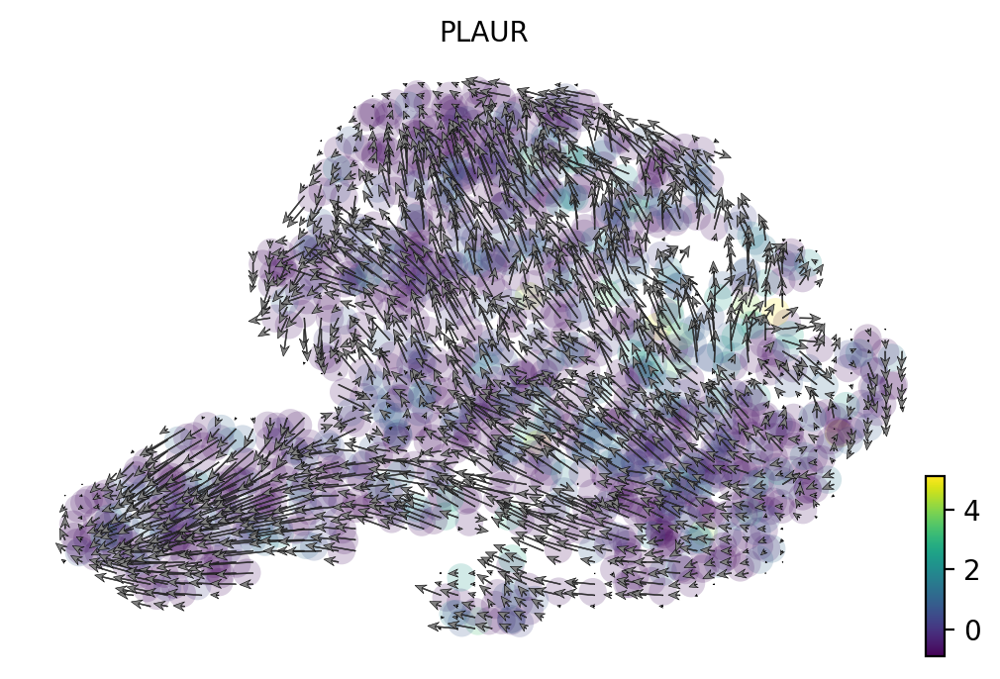

now plotting for batch BMP9-TGFB1


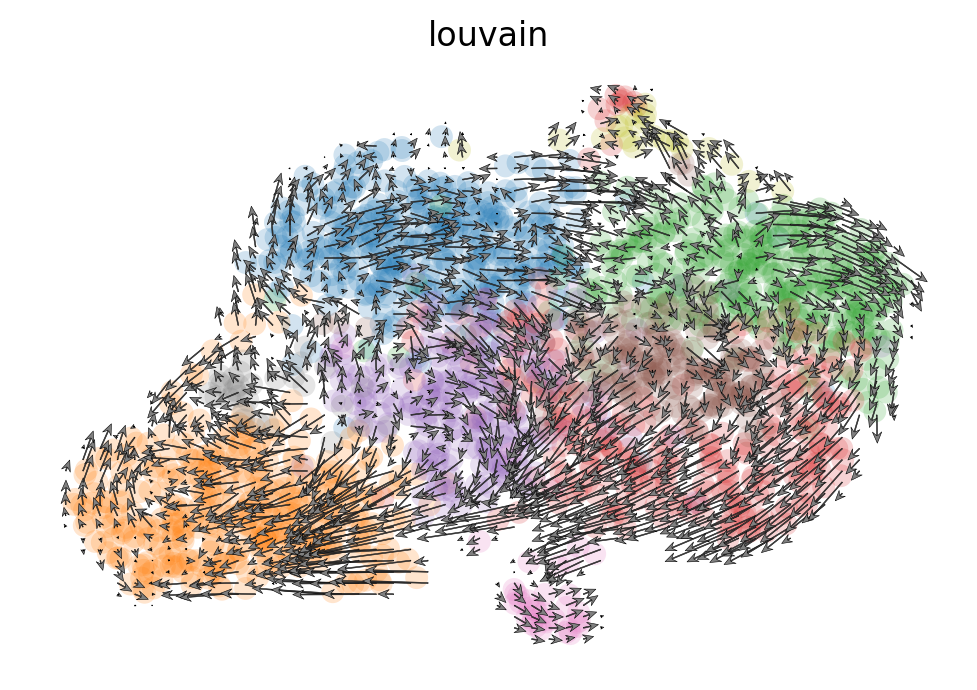

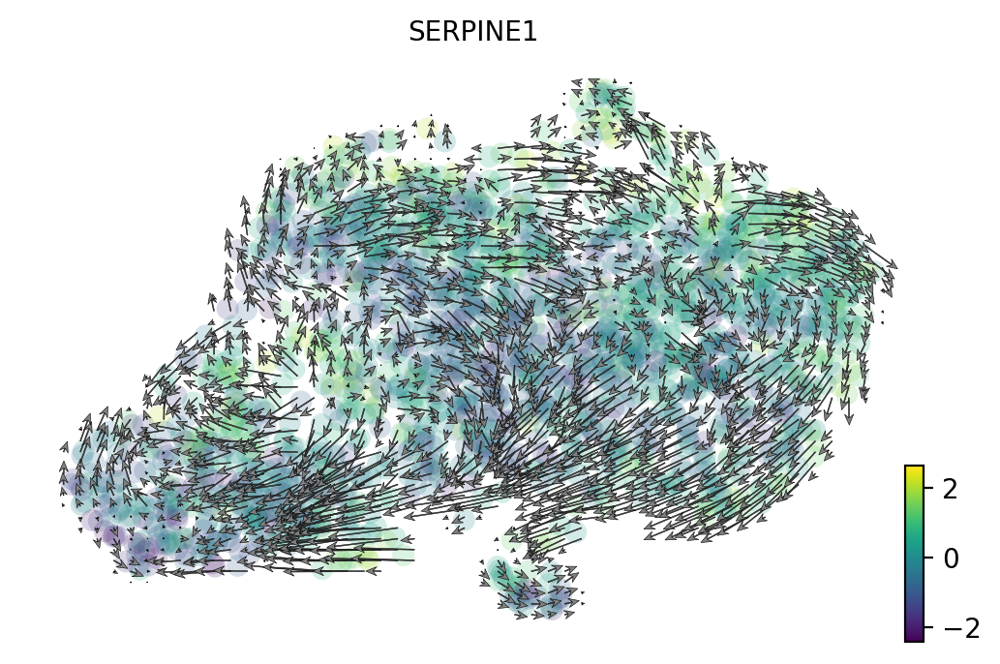

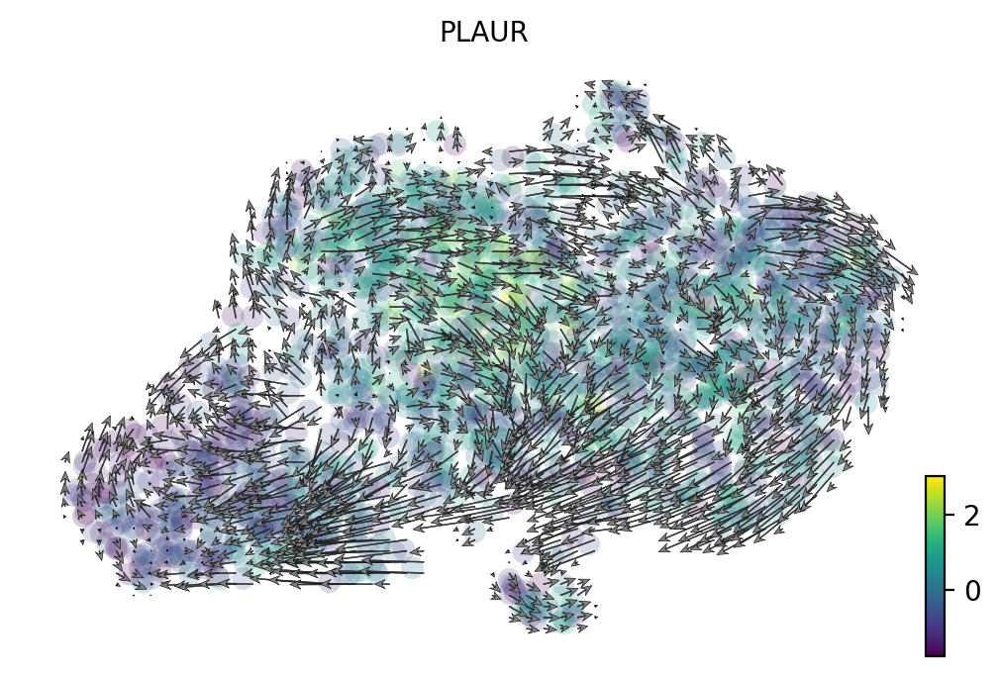

In [6]:
for batch, matrix in batches.items():
    print("now plotting for batch", batch)
    
    for color in COLOR_VELOCITY_BY:
        scv.pl.velocity_embedding_grid(matrix, basis='umap', color=color, arrow_length=6, arrow_size=2, dpi=200)

## Save results to disk

In [7]:
for batch, matrix in batches.items():
    filename = "tgfb1-5-" + batch + ".h5ad"
    filename = os.path.join("write", filename)
    matrix.write(filename)